# Prompt Generator for Stable Diffusion

```{note}
Install ekorpkit package first.

Set logging level to Warning, if you don't want to see verbose logging.

If you run this notebook in Colab, set Hardware accelerator to GPU.
```

```python
%pip install -U --pre ekorpkit[art]

exit()
```

## Preparing the environment


In [1]:
from ekorpkit import eKonf

eKonf.setLogger("INFO")
print("version:", eKonf.__version__)

is_colab = eKonf.is_colab()
print("is colab?", is_colab)
if is_colab:
    eKonf.mount_google_drive()
workspace_dir = "/content/drive/MyDrive/workspace"
project_name = "ekorpkit-book"
ws = eKonf.set_workspace(workspace=workspace_dir, project=project_name)
print("project_dir:", ws.project_dir)
ws.envs.dict(exclude_none=True)

INFO:ekorpkit.utils.notebook:Google Colab not detected.
INFO:ekorpkit.base:Set environment variable EKORPKIT_WORKSPACE_ROOT=/content/drive/MyDrive/workspace
INFO:ekorpkit.base:Set environment variable EKORPKIT_PROJECT_DIR=/content/drive/MyDrive/workspace/projects/ekorpkit-book


version: 0.1.40.post0.dev51
is colab? False


INFO:root:compose config with overrides: ['+project=default']
INFO:ekorpkit.base:There are no arguments to initilize a config, using default config.
INFO:ekorpkit.base:Set environment variable WANDB_DIR=/content/drive/MyDrive/workspace/projects/ekorpkit-book/logs
INFO:ekorpkit.base:Set environment variable CACHED_PATH_CACHE_ROOT=/content/drive/MyDrive/workspace/.cache/cached_path


project_dir: /content/drive/MyDrive/workspace/projects/ekorpkit-book


{'EKORPKIT_CONFIG_DIR': '/workspace/projects/ekorpkit-book/config',
 'EKORPKIT_WORKSPACE_ROOT': '/content/drive/MyDrive/workspace',
 'EKORPKIT_PROJECT': 'ekorpkit-book',
 'EKORPKIT_PROJECT_DIR': '/content/drive/MyDrive/workspace/projects/ekorpkit-book',
 'EKORPKIT_LOG_LEVEL': 'INFO',
 'NUM_WORKERS': 230,
 'KMP_DUPLICATE_LIB_OK': 'TRUE',
 'WANDB_DIR': '/content/drive/MyDrive/workspace/projects/ekorpkit-book/logs',
 'LABEL_STUDIO_SERVER': 'http://ekorpkit-labelstudio:8080',
 'CACHED_PATH_CACHE_ROOT': '/content/drive/MyDrive/workspace/.cache/cached_path'}

time: 930 ms (started: 2022-12-13 07:44:35 +00:00)


## Load a Generator and Generate Prompts

To download a certain dataset or model checkpoint, you may need to provide a HuggingFace API token. You can get one from [here](https://huggingface.co/settings/token).

```python
# Set HuggingFace API token
ws.secrets.HUGGING_FACE_HUB_TOKEN = "YOUR_TOKEN"
```

In [2]:
# Set HuggingFace API token
# ws.secrets.HUGGING_FACE_HUB_TOKEN = "YOUR_TOKEN"

ws.secrets.HUGGING_FACE_HUB_TOKEN

SecretStr('**********')

time: 21.3 ms (started: 2022-12-13 07:44:37 +00:00)


In [3]:
# Set CUDA DEVICES for the model

ws.envs.CUDA_VISIBLE_DEVICES = "1,2"

INFO:ekorpkit.base:Set environment variable CUDA_VISIBLE_DEVICES=1,2


time: 25.5 ms (started: 2022-12-13 07:44:38 +00:00)


In [4]:
from ekorpkit.tasks.nlp import PromptGenerator

pgen = PromptGenerator()

2022-12-13 07:44:39.572581: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
INFO:absl:Unable to initialize backend 'tpu_driver': NOT_FOUND: Unable to find driver in registry given worker: 
INFO:absl:Unable to initialize backend 'rocm': NOT_FOUND: Could not find registered platform with name: "rocm". Available platform names are: CUDA Host Interpreter
INFO:absl:Unable to initialize backend 'tpu': module 'jaxlib.xla_extension' has no attribute 'get_tpu_client'
INFO:root:compose config with overrides: ['task=stable.prompt']
INFO:ekorpkit.config:Initalized batch: prompt-generator(4) in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart
INFO:ekorpkit.base:No method defined to call


time: 8.64 s (started: 2022-12-13 07:44:39 +00:00)


### Loading a model

Before loading a model, you need to train a model first. To train a model, refer to the [Training a Generator](#training-a-generator) section.

In [5]:

# pgen.load_model(model_name="ekorpkit/stable-prompts")

pgen.load_model(model_name="ekorpkit/prompt_parrot")


INFO:ekorpkit.config:Initalized batch: prompt-generator(4) in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart
[INFO|configuration_utils.py:652] 2022-12-13 07:44:48,126 >> loading configuration file /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/prompt_parrot/config.json
[INFO|configuration_utils.py:706] 2022-12-13 07:44:48,127 >> Model config GPT2Config {
  "_name_or_path": "/content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/prompt_parrot",
  "_num_labels": 1,
  "activation_function": "gelu_new",
  "architectures": [
    "GPT2LMHeadModel"
  ],
  "attn_pdrop": 0.1,
  "bos_token_id": 50256,
  "embd_pdrop": 0.1,
  "eos_token_id": 50256,
  "id2label": {
    "0": "LABEL_0"
  },
  "initializer_range": 0.02,
  "label2id": {
    "LABEL_0": 0
  },
  "layer_norm_epsilon": 1e-05,
  "model_type": "gpt2",
  "n_ctx": 1024,
  "n_embd": 768,
  "n_head": 12,
  "n_inner": null,
  "n_layer": 6,
  "n_positions": 1024,
  "reorder_and_u

time: 1.32 s (started: 2022-12-13 07:44:47 +00:00)


### Generating prompts

You can generate prompts using the `generate_prompts` function. The function takes the following arguments:

- `prompt`: The prompt to be used for generating prompts. If `None`, the prompt will be generated automatically.
- `num_prompts_to_generate`: The number of prompts to be generated.
- `generate_images`: Whether to generate images for the prompts.
- `num_samples`: The number of images to be generated for each prompt.
- For other arguments, refer to the following code.


In [8]:
pgen.method.generate.dict()

{'prompt': None,
 'num_prompts_to_generate': 5,
 'max_prompt_length': 50,
 'min_prompt_length': 30,
 'temperature': 1.2,
 'top_k': 70,
 'top_p': 0.9}

time: 2.51 ms (started: 2022-12-13 07:45:20 +00:00)


INFO:ekorpkit.visualize.collage:Creating collage of 3 images with 3 columns from 3 images
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/m6-forest/m6-forest.text_prompts(16)_run_configs_text_prompts(0).png


Prompt[0]: tamed lions in the forest in an henri rousseau style, digital art, award winning, artstation, moody palette, moody palette, highly detailed, award winning, dramatic scenery, oil on canvas, masterpiece, award-winning photograph, moody palette, masterpiece, moody


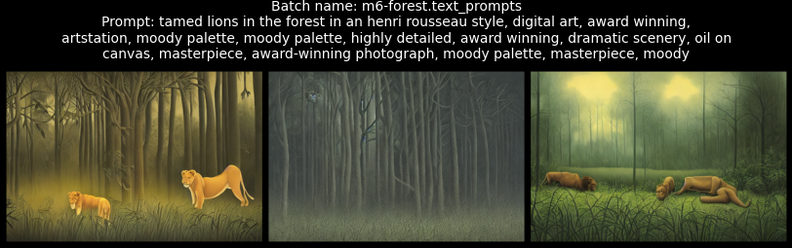

INFO:ekorpkit.visualize.collage:Creating collage of 3 images with 3 columns from 3 images
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/m6-forest/m6-forest.text_prompts(16)_run_configs_text_prompts(1).png


Prompt[1]: tamed lions in the forest in an henri rousseau style, digital art, magical realism, beautiful landscape, cinematic lighting, vibrant, by John Atkinson Grimshaw, highly detailed painting, soft render, soft render, vibrant, concept art, by John Atkinson Grimshaw and Vincent di Fate,


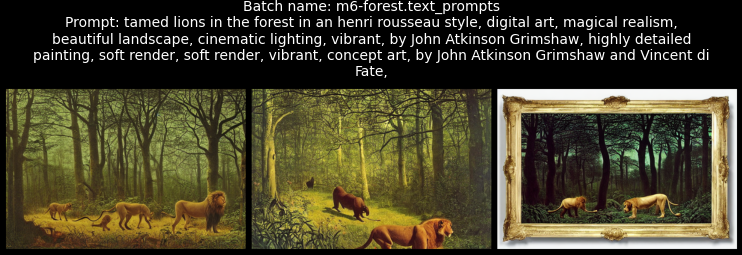

INFO:ekorpkit.visualize.collage:Creating collage of 3 images with 3 columns from 3 images
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/m6-forest/m6-forest.text_prompts(16)_run_configs_text_prompts(2).png


Prompt[2]: tamed lions in the forest in an henri rousseau style, highly detailed illustration, magical realism, octane soft render, oil on canvas, moody palette, aesthetic, oil on canvas, aesthetic, oil on canvas, moody palette, moody palette, palette, digital illustration,


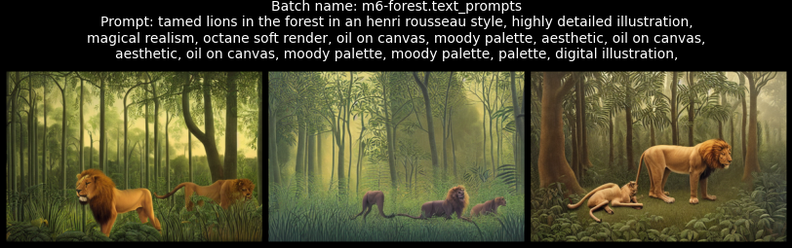

INFO:ekorpkit.visualize.collage:Creating collage of 3 images with 3 columns from 3 images
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/m6-forest/m6-forest.text_prompts(16)_run_configs_text_prompts(3).png


Prompt[3]: tamed lions in the forest in an henri rousseau style, highly detailed, digital painting, artstation, concept art, cinematic lighting, vibrant, illustration, magical realism, concept art, award-winning, matte painting, illustration, character design, magical realism, masterpiece, watercolor,


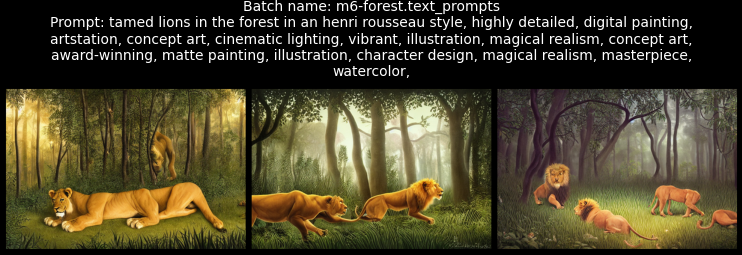

INFO:ekorpkit.visualize.collage:Creating collage of 3 images with 3 columns from 3 images
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/m6-forest/m6-forest.text_prompts(16)_run_configs_text_prompts(4).png


Prompt[4]: tamed lions in the forest in an henri rousseau style, oil on canvas, award winning, cinematic lighting, concept art, vivid, vibrant, cinematic, artstation, concept design, octane, trending on artstation, greg rutkowski and alphonse mucha,


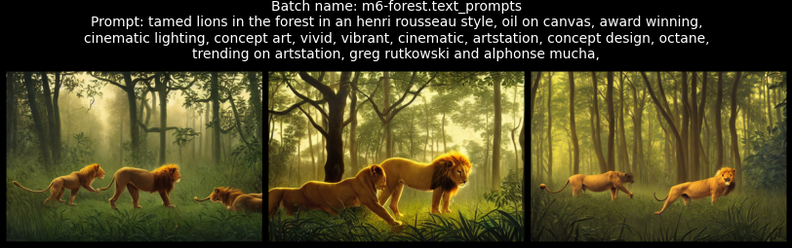

['tamed lions in the forest in an henri rousseau style, digital art, award winning, artstation, moody palette, moody palette, highly detailed, award winning, dramatic scenery, oil on canvas, masterpiece, award-winning photograph, moody palette, masterpiece, moody',
 'tamed lions in the forest in an henri rousseau style, digital art, magical realism, beautiful landscape, cinematic lighting, vibrant, by John Atkinson Grimshaw, highly detailed painting, soft render, soft render, vibrant, concept art, by John Atkinson Grimshaw and Vincent di Fate,',
 'tamed lions in the forest in an henri rousseau style, highly detailed illustration, magical realism, octane soft render, oil on canvas, moody palette, aesthetic, oil on canvas, aesthetic, oil on canvas, moody palette, moody palette, palette, digital illustration,',
 'tamed lions in the forest in an henri rousseau style, highly detailed, digital painting, artstation, concept art, cinematic lighting, vibrant, illustration, magical realism, conc

time: 1min 59s (started: 2022-12-13 07:45:21 +00:00)


In [9]:
prompts = pgen.generate_prompts(
    batch_name = "m6-forest",
    prompt="tamed lions in the forest in an henri rousseau style",
    num_prompts_to_generate=5,
    generate_images=True,
    num_samples=3,
    max_prompt_length=60,
    top_p=0.8,
    temperature=0.95,
)
prompts

### Generating images for prompts

Prompt[0]: people looking out a window at night in ancient ruins, in a highly detailed epic CG render, dramatic light, epic shadows, dramatic lightinga 3D portrait of a dragon from a fantasy fantasy medium portrait in a beautiful fantasy, elegant, high detail,


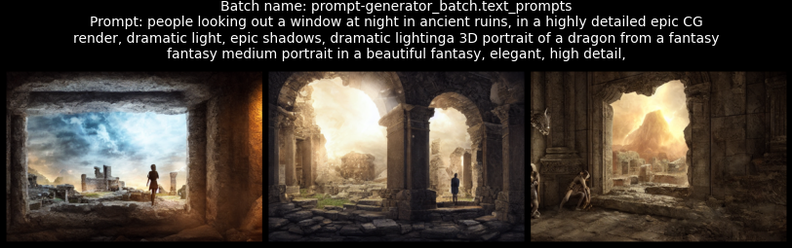

Prompt[1]: people looking out a window, d & d, fantasy, intricate, elegant, highly detailed, digital painting, artstation, concept art, smooth, sharp focus, illustration, art by artgerm and greg rutkowski and alphonse


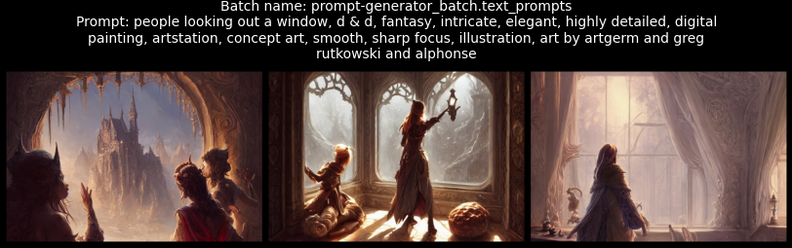

Prompt[2]: people looking out a window at night, in the style of Daniel Craig and Steve Austin. trending on artstationin a desert, d & d, fantasy, intricate, elegant, highly detailed, digital painting, artstation, concept art, smooth,


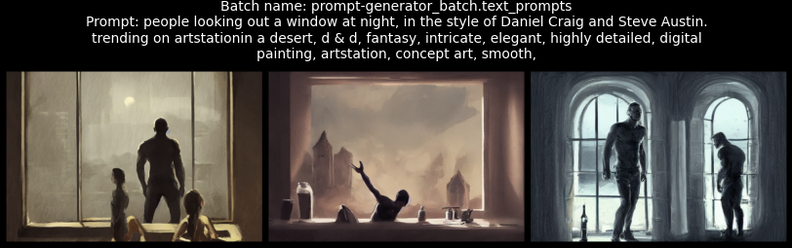

Prompt[3]: people looking out a window at a beautiful view over the bridge on theland, the riverbeds of mountains, beautiful dramatic lighting, beautiful landscape, perfect face, intricate details, artstationhd, cgsocietya photo of an orange


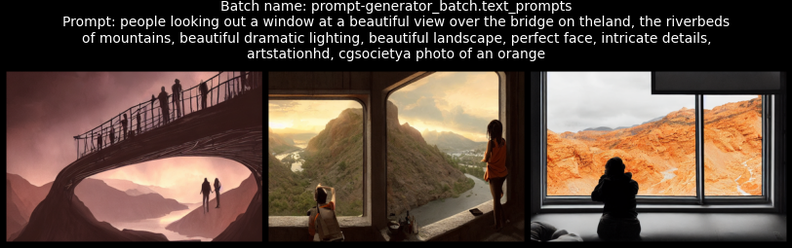

Prompt[4]: people looking out a window. The eyes, fine details, elegant, by greg rutkowski and alphonse muchacloseup shot of a cyberpunk robot in front of a dark dark cave, full of colors, vibrant, intricate,


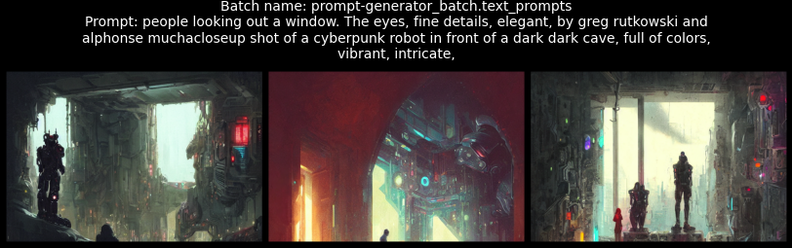

time: 1min 28s (started: 2022-12-02 21:12:49 +00:00)


In [6]:
results = pgen.generate_images(
    prompts=prompts,
    num_samples=3,
    num_inference_steps=50,
)

### Generating images for one prompt

Prompt: people looking out a window at night in ancient ruins, in a highly detailed epic CG render, dramatic light, epic shadows, dramatic lightinga 3D portrait of a dragon from a fantasy fantasy medium portrait in a beautiful fantasy, elegant, high detail,


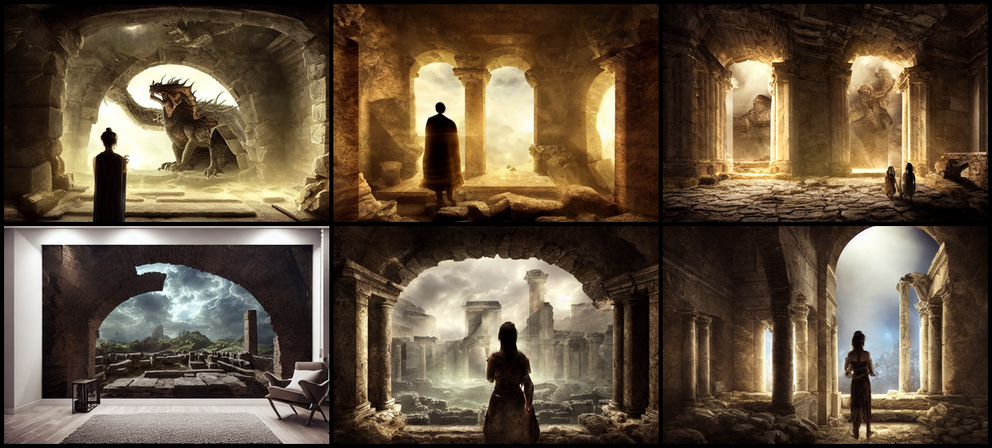

time: 33.5 s (started: 2022-12-02 21:14:27 +00:00)


In [7]:
results = pgen.imagine(
    text_prompts=prompts[0],
    num_samples=6,
    num_inference_steps=50,
    guidance_scale=10,
)

## Training a Generator

### Preparing a dataset

You can use any dataset you want. However, the dataset should be in the format of [HuggingFace Datasets](https://huggingface.co/docs/datasets/).

#### Using a dataset from HuggingFace Hub

To track runs with wandb, you may need to provide a Weights & Biases API Key. You can get one from [here](https://wandb.ai/settings).

```python
# Set WANDB API KEY
eKonf.os.secrets.WANDB_API_KEY = "YOUR_KEY"
```

In [5]:
# Set WANDB API KEY
# eKonf.os.secrets.WANDB_API_KEY = "YOUR_KEY"

print(eKonf.os.secrets.WANDB_API_KEY)

**********
time: 21.3 ms (started: 2022-12-13 06:47:50 +00:00)


In [10]:
pgen.dataset.validation_split_percentage = 5
pgen.load_datasets("Gustavosta/Stable-Diffusion-Prompts")
pgen.raw_datasets

INFO:root:Loading dataset Gustavosta/Stable-Diffusion-Prompts
INFO:datasets.builder:Overwrite dataset info from restored data version.
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec


  0%|          | 0/2 [00:00<?, ?it/s]

INFO:datasets.builder:Overwrite dataset info from restored data version.
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec
INFO:datasets.builder:Overwrite dataset info from restored data version.
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0

DatasetDict({
    train: Dataset({
        features: ['Prompt'],
        num_rows: 70032
    })
    test: Dataset({
        features: ['Prompt'],
        num_rows: 8192
    })
    validation: Dataset({
        features: ['Prompt'],
        num_rows: 3686
    })
})

time: 14.8 s (started: 2022-12-13 07:47:29 +00:00)


In [11]:
model_name = "ekorpkit/stable-prompts"

pgen.dataset.line_by_line = False
pgen.trainer.num_train_epochs = 1
pgen.trainer.logging_steps = 100
pgen.model.model_name = model_name
# pgen.model.ignore_model_path = True

pgen.train()

INFO:ekorpkit.config:Initalized batch: m6-forest(15) in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart
INFO:ekorpkit.models.transformer.trainers.base:Moving model to device: cuda:0


Running tokenizer on every text in dataset:   0%|          | 0/71 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-c18d25663c203982.arrow


Running tokenizer on every text in dataset:   0%|          | 0/9 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-3aa9bea172d94ae9.arrow


Running tokenizer on every text in dataset:   0%|          | 0/4 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-a46354bdc81f9d52.arrow


Grouping texts in chunks of 1024:   0%|          | 0/71 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-3fc91025cb36262f.arrow


Grouping texts in chunks of 1024:   0%|          | 0/9 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-956d8af8599c87e9.arrow


Grouping texts in chunks of 1024:   0%|          | 0/4 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-cdf3af7b5477eadc.arrow
[INFO|trainer.py:557] 2022-12-13 07:48:06,993 >> Using cuda_amp half precision backend
INFO:ekorpkit.config:Saving config to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/m6-forest/configs/m6-forest(15)_config.yaml
[INFO|trainer.py:725] 2022-12-13 07:48:10,030 >> The following columns in the training set don't have a corresponding argument in `GPT2LMHeadModel.forward` and have been ignored: special_tokens_mask. If special_tokens_mask are not expected by `GPT2LMHeadModel.forward`,  you can safely ignore this message.
[INFO|trainer.py:1608] 2022-12-13 07:48:10,039 >> ***** Running training *****
[INFO|trainer.py:1609] 2022-12-13 07:48:10,039 >>   Num examples = 4242
[INFO|trainer.py:1610] 2022-12-

[WARNING|logging.py:275] 2022-12-13 07:48:17,830 >> You're using a GPT2TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


Step,Training Loss,Validation Loss


[INFO|trainer.py:1859] 2022-12-13 07:49:48,614 >> 

Training completed. Do not forget to share your model on huggingface.co/models =)


[INFO|trainer.py:2678] 2022-12-13 07:49:48,617 >> Saving model checkpoint to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/stable-prompts
[INFO|configuration_utils.py:447] 2022-12-13 07:49:48,619 >> Configuration saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/stable-prompts/config.json
[INFO|modeling_utils.py:1624] 2022-12-13 07:49:49,134 >> Model weights saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/stable-prompts/pytorch_model.bin
[INFO|tokenization_utils_base.py:2125] 2022-12-13 07:49:49,135 >> tokenizer config file saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/stable-prompts/tokenizer_config.json
[INFO|tokenization_utils_base.py:2132] 2022-12-13 07:49:49,136 >> Special tokens file saved in /conten

***** train metrics *****
  epoch                    =        1.0
  total_flos               =  1031810GF
  train_loss               =     1.8296
  train_runtime            = 0:01:38.57
  train_samples            =       4242
  train_samples_per_second =     43.034
  train_steps_per_second   =      2.688


***** eval metrics *****
  epoch                   =        1.0
  eval_loss               =     1.7144
  eval_runtime            = 0:00:01.98
  eval_samples            =        222
  eval_samples_per_second =    111.995
  eval_steps_per_second   =     55.997
  perplexity              =     5.5533


[INFO|modelcard.py:449] 2022-12-13 07:49:52,110 >> Dropping the following result as it does not have all the necessary fields:
{'task': {'name': 'Causal Language Modeling', 'type': 'text-generation'}, 'dataset': {'name': 'Gustavosta/Stable-Diffusion-Prompts', 'type': 'Gustavosta/Stable-Diffusion-Prompts'}}


time: 2min 8s (started: 2022-12-13 07:47:44 +00:00)


INFO:ekorpkit.visualize.collage:Creating collage of 2 images with 2 columns from 2 images
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/m6-forest_batch/m6-forest_batch.text_prompts(0)_run_configs_text_prompts(0).png


Prompt[0]: people looking out a lonely city street looking out onto a country road, looking at the ocean, highly detailed, digital painting, artstation, concept art, soft light, sharp focus, illustration, art by artgerm and greg rutkowski


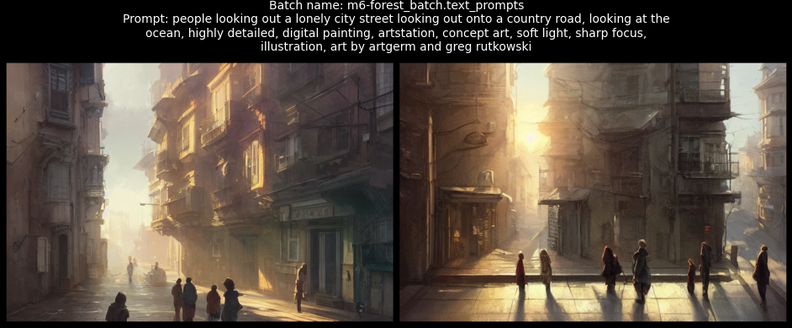

INFO:ekorpkit.visualize.collage:Creating collage of 2 images with 2 columns from 2 images
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/m6-forest_batch/m6-forest_batch.text_prompts(0)_run_configs_text_prompts(1).png


Prompt[1]: people looking out a lonely city street in the distance, anime fantasy illustration, fantasy, highly detailed, digital painting, trending on artstation, smooth, sharp focus, illustration, dreamlike, Artstationbeautiful fantasy digital art portrait painting of an anime


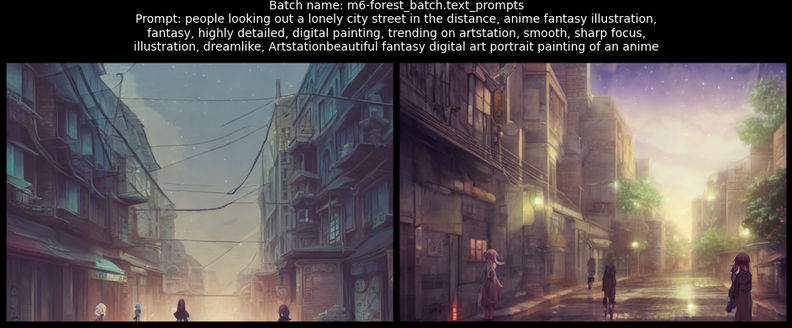

time: 35.4 s (started: 2022-12-13 07:49:57 +00:00)


In [12]:
pgen.load_model(model_name=model_name)
prompts = pgen.generate_prompts(
    prompt="people looking out a lonely city street",
    num_prompts_to_generate=2,
    generate_images=True,
    num_samples=2,
)

#### Using a dataset from a text file

In [7]:
prompt_uri = "https://raw.githubusercontent.com/entelecheia/ekorpkit-book/main/assets/data/prompt_parrot.txt"
pgen.load_datasets(train_file=prompt_uri)
pgen.raw_datasets

INFO:root:Loading validation dataset None
INFO:datasets.builder:Overwrite dataset info from restored data version.
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/text/default-681f997af4470be8/0.0.0/21a506d1b2b34316b1e82d0bd79066905d846e5d7e619823c0dd338d6f1fa6ad
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/text/default-681f997af4470be8/0.0.0/21a506d1b2b34316b1e82d0bd79066905d846e5d7e619823c0dd338d6f1fa6ad
INFO:root:Loading training dataset https://raw.githubusercontent.com/entelecheia/ekorpkit-book/main/assets/data/prompt_parrot.txt
INFO:datasets.builder:Overwrite dataset info from restored data version.
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/text/default-681f997af4470be8/0.0.0/21a506d1b2b34316b1e82d0bd79066905d846e5d7e619823c0dd338d6f1fa6ad
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/text/default-681f997af4470be8/0.0.0/21a

DatasetDict({
    validation: Dataset({
        features: ['text'],
        num_rows: 9
    })
    train: Dataset({
        features: ['text'],
        num_rows: 176
    })
})

time: 2.65 s (started: 2022-12-13 06:53:51 +00:00)


In [8]:
model_name="ekorpkit/prompt_parrot"

pgen.dataset.line_by_line = True
pgen.trainer.num_train_epochs = 10
pgen.trainer.logging_steps = 100
pgen.model.model_name = model_name

pgen.train()

INFO:ekorpkit.config:Initalized batch: prompt-generator(2) in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart


Running tokenizer on dataset line_by_line:   0%|          | 0/1 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/text/default-681f997af4470be8/0.0.0/21a506d1b2b34316b1e82d0bd79066905d846e5d7e619823c0dd338d6f1fa6ad/cache-1a86cc9859717c6c.arrow


Running tokenizer on dataset line_by_line:   0%|          | 0/1 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/text/default-681f997af4470be8/0.0.0/21a506d1b2b34316b1e82d0bd79066905d846e5d7e619823c0dd338d6f1fa6ad/cache-f4352de44b50776d.arrow
[INFO|trainer.py:557] 2022-12-13 06:53:56,462 >> Using cuda_amp half precision backend
INFO:ekorpkit.config:Saving config to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/prompt-generator/configs/prompt-generator(2)_config.yaml
[INFO|trainer.py:725] 2022-12-13 06:53:58,046 >> The following columns in the training set don't have a corresponding argument in `GPT2LMHeadModel.forward` and have been ignored: special_tokens_mask. If special_tokens_mask are not expected by `GPT2LMHeadModel.forward`,  you can safely ignore this message.
[INFO|trainer.py:1608] 2022-12-13 06:53:58,055 >> ***** Running training *****
[INFO|trainer.py:1609] 2022-12-13 06:53:58,055 >>   Num examples = 176
[INFO|trainer.py:1610] 2022-12-13 06:53:58,056 >>   Num Epochs =

Step,Training Loss,Validation Loss


[INFO|trainer.py:1859] 2022-12-13 06:54:34,698 >> 

Training completed. Do not forget to share your model on huggingface.co/models =)


[INFO|trainer.py:2678] 2022-12-13 06:54:34,701 >> Saving model checkpoint to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/prompt_parrot
[INFO|configuration_utils.py:447] 2022-12-13 06:54:34,703 >> Configuration saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/prompt_parrot/config.json
[INFO|modeling_utils.py:1624] 2022-12-13 06:54:35,166 >> Model weights saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/prompt_parrot/pytorch_model.bin
[INFO|tokenization_utils_base.py:2125] 2022-12-13 06:54:35,168 >> tokenizer config file saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/prompt_parrot/tokenizer_config.json
[INFO|tokenization_utils_base.py:2132] 2022-12-13 06:54:35,168 >> Special tokens file saved in /content/dr

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   428298GF
  train_loss               =      3.136
  train_runtime            = 0:00:36.64
  train_samples            =        176
  train_samples_per_second =     48.034
  train_steps_per_second   =      3.002


***** eval metrics *****
  epoch                   =       10.0
  eval_loss               =     3.5238
  eval_runtime            = 0:00:00.08
  eval_samples            =          9
  eval_samples_per_second =     102.68
  eval_steps_per_second   =     57.044
  perplexity              =    33.9116


[INFO|modelcard.py:449] 2022-12-13 06:54:36,253 >> Dropping the following result as it does not have all the necessary fields:
{'task': {'name': 'Causal Language Modeling', 'type': 'text-generation'}}


time: 42.3 s (started: 2022-12-13 06:53:54 +00:00)


INFO:ekorpkit.visualize.collage:Creating collage of 2 images with 2 columns from 2 images
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/prompt-generator_batch/prompt-generator_batch.text_prompts(0)_run_configs_text_prompts(0).png


Prompt[0]: people looking out a lonely city street, foggy foggy streets, trending on artstation, oil on canvas, award-winning, dramatic lighting, vibrant, vibrant, vibrant, surrealism, high coherence, foggy skies, low contrast,


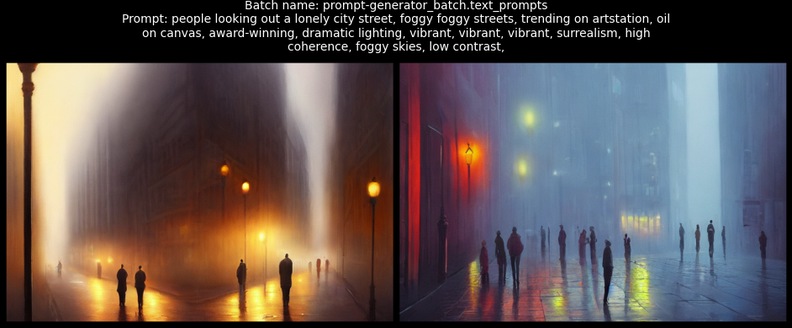

INFO:ekorpkit.visualize.collage:Creating collage of 2 images with 2 columns from 2 images
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/prompt-generator_batch/prompt-generator_batch.text_prompts(0)_run_configs_text_prompts(1).png


Prompt[1]: people looking out a lonely city street in an industrial field of flowers landscape painting by Thomas Kinkade and Lawrence Alma-Tadema, digital art, beautiful composition, vibrant palette, moody palette, concept art, award winning, octane soft


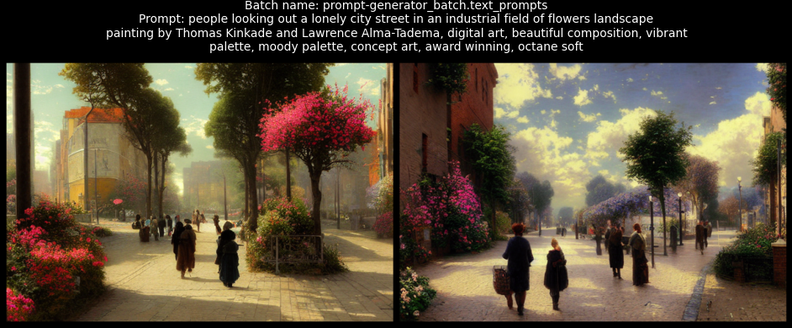

time: 1min 36s (started: 2022-12-13 06:56:18 +00:00)


In [9]:
pgen.load_model(model_name=model_name)
prompts = pgen.generate_prompts(
    prompt="people looking out a lonely city street",
    num_prompts_to_generate=2,
    generate_images=True,
    num_samples=2,
)

## References

- [Gustavosta/Stable-Diffusion-Prompts](https://huggingface.co/datasets/Gustavosta/Stable-Diffusion-Prompts)